In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from tqdm.notebook import tqdm
warnings.filterwarnings('ignore')
%matplotlib inline

import tensorflow as tf
from keras.preprocessing.image import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input

2025-06-25 17:59:06.314099: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750874346.541662      73 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750874346.602453      73 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
BASE_DIR_FEM = '../input/refined-dataset/Task_A/train/female/'
BASE_DIR_MAL = '../input/refined-dataset/Task_A/train/male/'

In [3]:
# labels - age, gender, ethnicity
image_paths = []
gender_labels = []

for filename in tqdm(os.listdir(BASE_DIR_FEM)):
    image_path = os.path.join(BASE_DIR_FEM, filename)
    image_paths.append(image_path)
    gender_labels.append(1)

for filename in tqdm(os.listdir(BASE_DIR_MAL)):
    image_path = os.path.join(BASE_DIR_MAL, filename)
    image_paths.append(image_path)
    gender_labels.append(0)

  0%|          | 0/394 [00:00<?, ?it/s]

  0%|          | 0/1532 [00:00<?, ?it/s]

In [4]:
df = pd.DataFrame()
df['image'],df['gender'] = image_paths,gender_labels
df.head()

,image,gender
0,../input/refined-dataset/Task_A/train/female/N...,1
1,../input/refined-dataset/Task_A/train/female/A...,1
2,../input/refined-dataset/Task_A/train/female/D...,1
3,../input/refined-dataset/Task_A/train/female/S...,1
4,../input/refined-dataset/Task_A/train/female/C...,1


In [5]:
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [6]:
df

,image,gender
0,../input/refined-dataset/Task_A/train/male/Bry...,0
1,../input/refined-dataset/Task_A/train/male/Col...,0
2,../input/refined-dataset/Task_A/train/male/Col...,0
3,../input/refined-dataset/Task_A/train/male/Sta...,0
4,../input/refined-dataset/Task_A/train/female/J...,1
...,...,...
1921,../input/refined-dataset/Task_A/train/male/Gar...,0
1922,../input/refined-dataset/Task_A/train/male/Mic...,0
1923,../input/refined-dataset/Task_A/train/male/Col...,0
1924,../input/refined-dataset/Task_A/train/male/Joh...,0


In [7]:
gender_dict = {0:'Male', 1:'Female'}

In [8]:
gender_dict[0]

'Male'

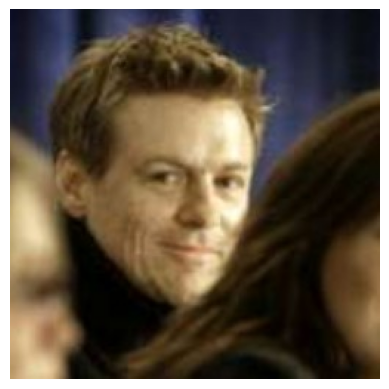

In [9]:
from PIL import Image
img = Image.open(df['image'][0])
plt.axis('off')
plt.imshow(img);

In [10]:
print(df["gender"].unique())  # Check what values exist


[0 1]


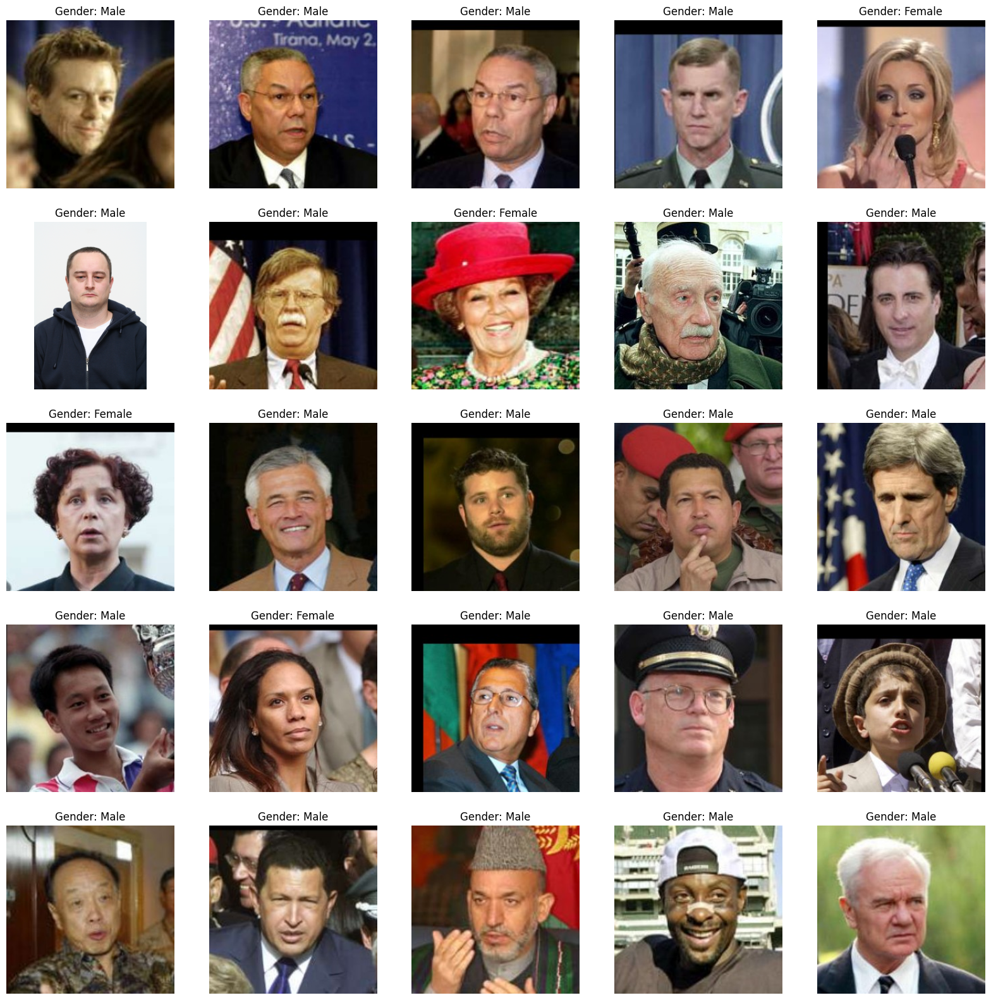

In [11]:
# to display grid of images
plt.figure(figsize=(20, 20))
files = df.iloc[0:25]

for index, file, gender in files.itertuples():
    plt.subplot(5, 5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Gender: {gender_dict[gender]}")
    plt.axis('off')

In [12]:
def extract_features(images):
    features = []
    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((128, 128), Image.LANCZOS)
        img = np.array(img)
        features.append(img)
        
    features = np.array(features)
    # ignore this step if using RGB
   # features = features.reshape(len(features), 128, 128, 1)
    return features

In [13]:
X = extract_features(df['image'])
X.shape

  0%|          | 0/1926 [00:00<?, ?it/s]

(1926, 128, 128, 3)

In [14]:
type(df['image'])

pandas.core.series.Series

In [15]:
y_gender = np.array(df['gender'])

In [16]:
input_shape = (128, 128, 3)

In [17]:
inputs = Input((input_shape))
# convolutional layers
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu') (inputs)
maxp_1 = MaxPooling2D(pool_size=(2, 2)) (conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu') (maxp_1)
maxp_2 = MaxPooling2D(pool_size=(2, 2)) (conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu') (maxp_2)
maxp_3 = MaxPooling2D(pool_size=(2, 2)) (conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu') (maxp_3)
maxp_4 = MaxPooling2D(pool_size=(2, 2)) (conv_4)

flatten = Flatten() (maxp_4)

# fully connected layers
dense_1 = Dense(256, activation='relu') (flatten)
dropout_1 = Dropout(0.3) (dense_1)
dense_2 = Dense(256, activation='relu') (dropout_1)
dropout_2 = Dropout(0.3) (dense_2)

output_1 = Dense(1, activation='sigmoid', name='gender_out') (dropout_1)

model = Model(inputs=[inputs], outputs=output_1)

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

I0000 00:00:1750874395.426834      73 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750874395.427552      73 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


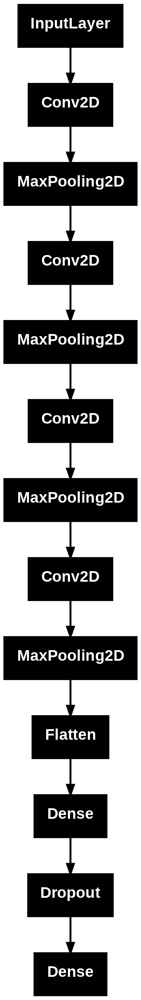

In [18]:
# plot the model
from tensorflow.keras.utils import plot_model
plot_model(model)

In [19]:
# train model
history = model.fit(x=X, y=y_gender, batch_size=32, epochs=30, validation_split=0.15)

Epoch 1/30


I0000 00:00:1750874400.095761     132 service.cc:148] XLA service 0x7c678000e810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1750874400.096756     132 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1750874400.096775     132 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1750874400.470271     132 cuda_dnn.cc:529] Loaded cuDNN version 90300


 9/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5514 - loss: 30.0615

I0000 00:00:1750874404.170858     132 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


52/52 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - accuracy: 0.6727 - loss: 11.2741 - val_accuracy: 0.8201 - val_loss: 0.3754
Epoch 2/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8091 - loss: 0.4159 - val_accuracy: 0.8408 - val_loss: 0.3878
Epoch 3/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8380 - loss: 0.3743 - val_accuracy: 0.8824 - val_loss: 0.3195
Epoch 4/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8637 - loss: 0.3055 - val_accuracy: 0.8443 - val_loss: 0.3639
Epoch 5/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8778 - loss: 0.2883 - val_accuracy: 0.8028 - val_loss: 0.3850
Epoch 6/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8818 - loss: 0.2677 - val_accuracy: 0.8651 - val_loss: 0.3283
Epoch 7/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9116 - loss: 0.2219 - val_accuracy: 0.8824 - val_loss: 0.3080
Epoch 8/30
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9132 - loss: 0.2159 - val_accuracy: 0.8685 - val_loss: 

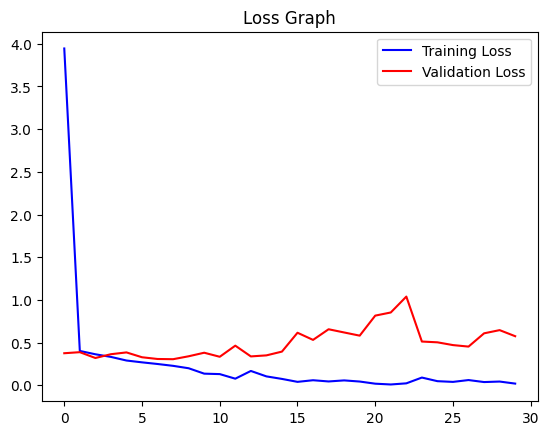

In [20]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [21]:
image_index = 100
print("Original Gender:", gender_dict[y_gender[image_index]])
# predict from model
pred = model.predict(X[image_index].reshape(1, 128, 128, 3))

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


In [22]:
pred

array([[0.99996245]], dtype=float32)

In [23]:
pred[0][0]

0.99996245

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted Gender: Female


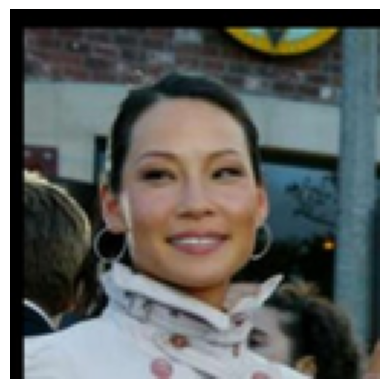

In [24]:
image_index = 1812
print("Original Gender:", gender_dict[y_gender[image_index]])
# predict from model
pred = model.predict(X[image_index].reshape(1, 128, 128, 3))
pred_gender = gender_dict[round(pred[0][0])]
print("Predicted Gender:", pred_gender)
plt.axis('off')
plt.imshow(X[image_index]);

In [25]:
BASE_DIR_FEM_test = '/kaggle/input/refined-dataset/Task_A/val/female'
BASE_DIR_MAL_test = '/kaggle/input/refined-dataset/Task_A/val/male'

In [26]:
# labels - age, gender, ethnicity
image_paths_test = []
gender_labels_test = []

for filename in tqdm(os.listdir(BASE_DIR_FEM_test)):
    image_path_test= os.path.join(BASE_DIR_FEM_test, filename)
    image_paths_test.append(image_path_test)
    gender_labels_test.append(1)

for filename in tqdm(os.listdir(BASE_DIR_MAL_test)):
    image_path_test = os.path.join(BASE_DIR_MAL_test, filename)
    image_paths_test.append(image_path_test)
    gender_labels_test.append(0)

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/317 [00:00<?, ?it/s]

In [27]:
image_paths_test

['/kaggle/input/refined-dataset/Task_A/val/female/Evie_Lazarou_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Christine_Gregoire_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Miyako_Miyazaki_0002.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Candice_Bergen_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Gloria_Gaynor_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Tomoko_Hagiwara_0002.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Teresa_Williams_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Gabi_Zimmer_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Jessica_Brungo_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Luther_Htu_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Edina_Batar_0001.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Fran_Drescher_0002.jpg',
 '/kaggle/input/refined-dataset/Task_A/val/female/Malak_Habbak_0001.jpg',
 '/kaggle/input/refin

In [28]:
df_test= pd.DataFrame()
df_test['image'],df_test['gender'] = image_paths_test,gender_labels_test
df_test.head()

,image,gender
0,/kaggle/input/refined-dataset/Task_A/val/femal...,1
1,/kaggle/input/refined-dataset/Task_A/val/femal...,1
2,/kaggle/input/refined-dataset/Task_A/val/femal...,1
3,/kaggle/input/refined-dataset/Task_A/val/femal...,1
4,/kaggle/input/refined-dataset/Task_A/val/femal...,1


In [29]:
df_test = df_test.sample(frac=1, random_state=42).reset_index(drop=True)

In [30]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 422 entries, 0 to 421
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   422 non-null    object
 1   gender  422 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 6.7+ KB


In [31]:
df_test

,image,gender
0,/kaggle/input/refined-dataset/Task_A/val/male/...,0
1,/kaggle/input/refined-dataset/Task_A/val/male/...,0
2,/kaggle/input/refined-dataset/Task_A/val/male/...,0
3,/kaggle/input/refined-dataset/Task_A/val/male/...,0
4,/kaggle/input/refined-dataset/Task_A/val/male/...,0
...,...,...
417,/kaggle/input/refined-dataset/Task_A/val/femal...,1
418,/kaggle/input/refined-dataset/Task_A/val/male/...,0
419,/kaggle/input/refined-dataset/Task_A/val/male/...,0
420,/kaggle/input/refined-dataset/Task_A/val/male/...,0


In [32]:
X_test = extract_features(df_test['image'])
X_test.shape

  0%|          | 0/422 [00:00<?, ?it/s]

(422, 128, 128, 3)

In [33]:
y_gender_test = np.array(df_test['gender'])

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted Gender: Male


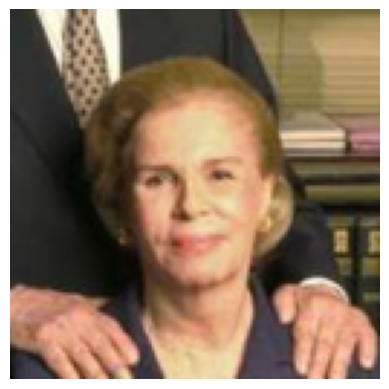

In [34]:
img_ind=29
print("Original Gender:", gender_dict[y_gender_test[img_ind]])
# predict from model
pred = model.predict(X_test[img_ind].reshape(1, 128, 128, 3))
pred_gender = gender_dict[round(pred[0][0])]
print("Predicted Gender:", pred_gender)
plt.axis('off')
plt.imshow(X_test[img_ind]);

In [35]:
y_true=[]
y_pred=[]
for index in range(422):
    pred = model.predict(X_test[index].reshape(1, 128, 128, 3))
    pred_gender = gender_dict[round(pred[0][0])]
    y_pred.append(round(pred[0][0]))
    y_true.append(y_gender_test[index])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

In [ ]:
y_pred

In [ ]:
y_true

In [50]:
from sklearn.metrics import accuracy_score,precision_score, recall_score, f1_score

In [39]:
accuracy_score(y_true,y_pred)

0.8530805687203792

In [51]:
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Precision: 0.7171717171717171
Recall: 0.6761904761904762
F1 Score: 0.696078431372549


In [52]:
model.save("gender_model.h5")

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted Gender: Male


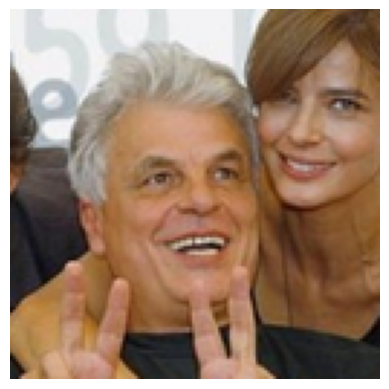

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted Gender: Male


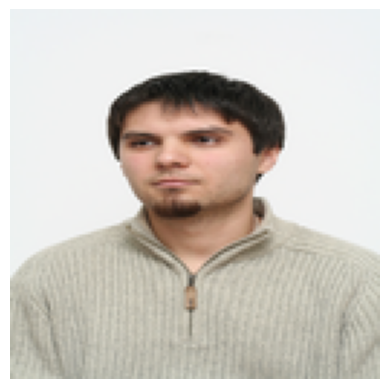

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Predicted Gender: Male


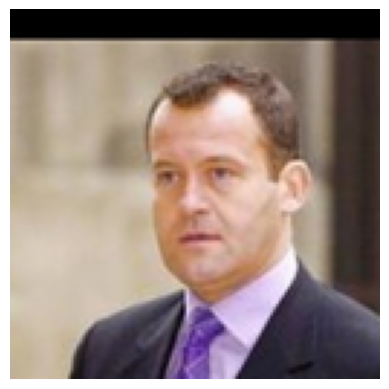

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


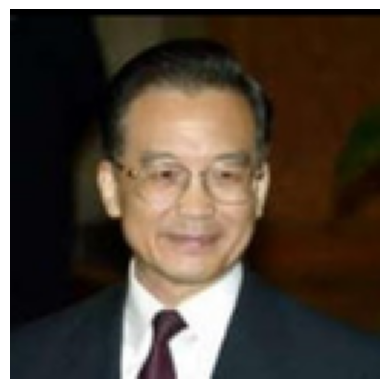

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


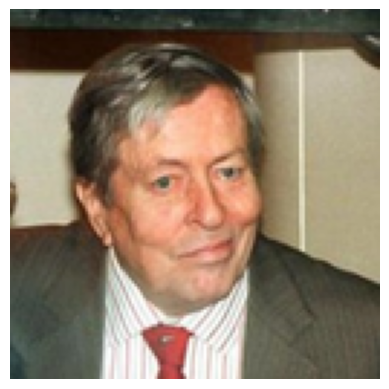

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Female


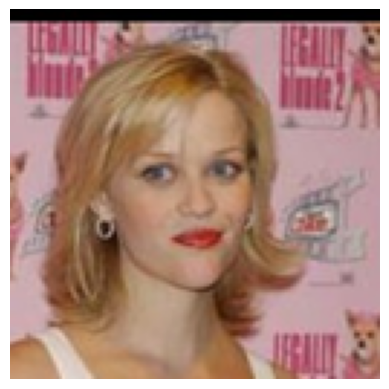

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Female


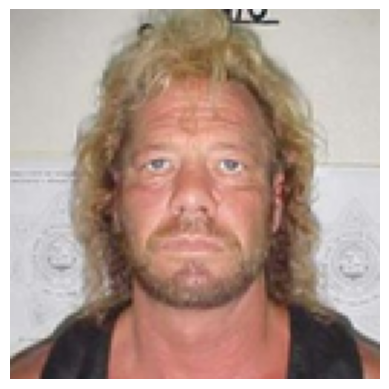

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


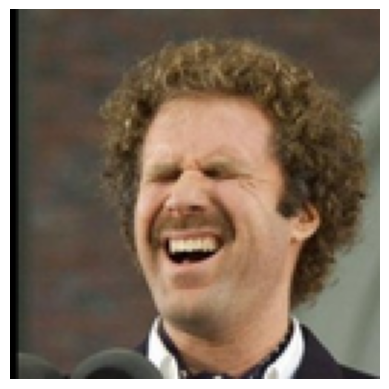

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Female


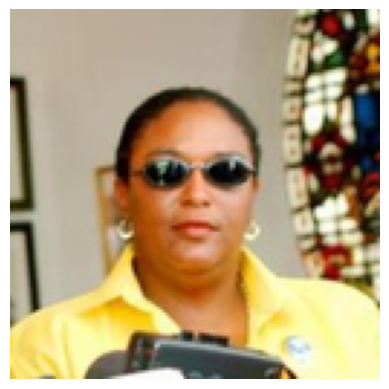

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


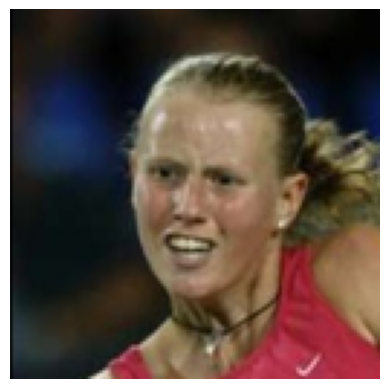

In [40]:
for i in range(10):
    print("Original Gender:", gender_dict[y_gender_test[i]])
    # predict from model
    pred = model.predict(X_test[i].reshape(1, 128, 128, 3))
    pred_gender = gender_dict[round(pred[0][0])]
    print("Predicted Gender:", pred_gender)
    plt.axis('off')
    plt.imshow(X_test[i])
    plt.show()

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Female


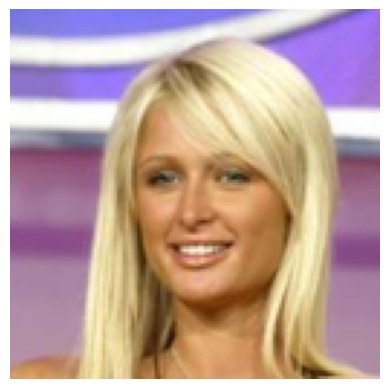

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted Gender: Male


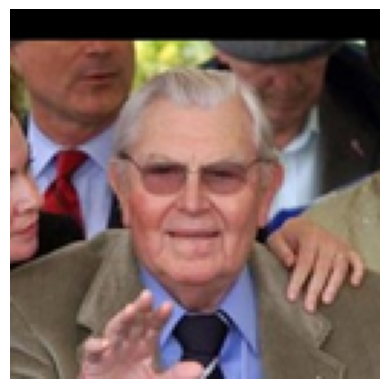

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Female


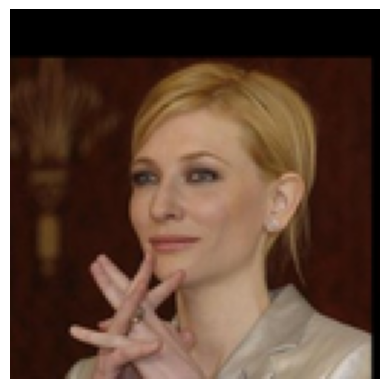

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


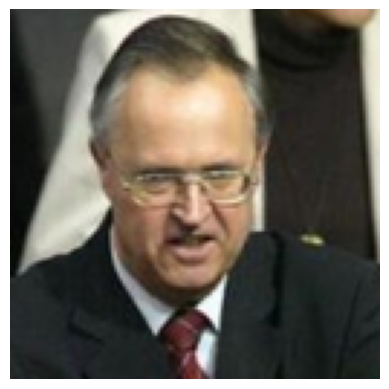

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


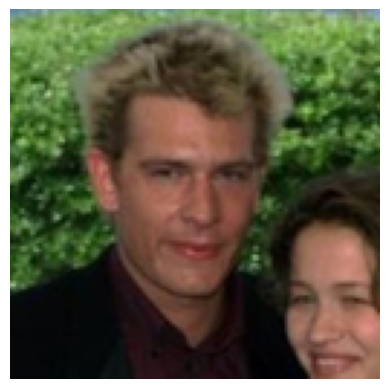

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Female


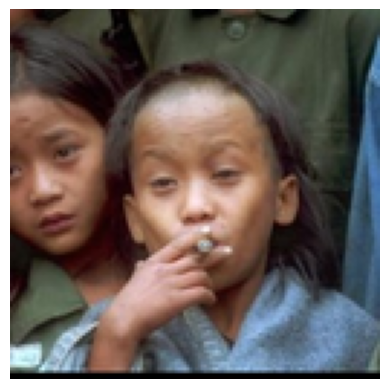

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted Gender: Male


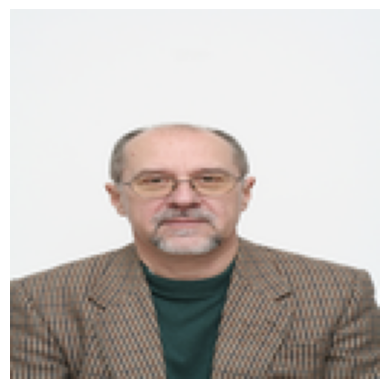

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


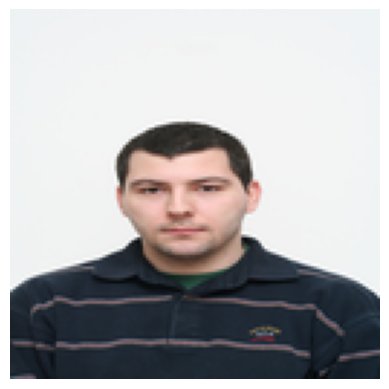

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


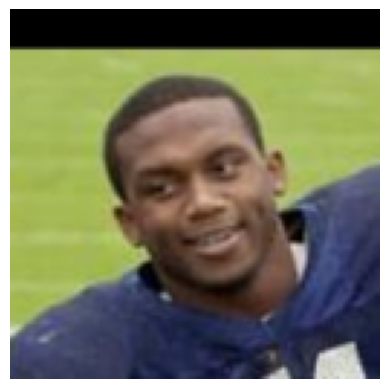

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


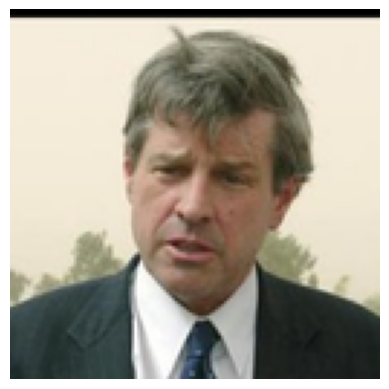

In [41]:
for i in range(11,21):
    print("Original Gender:", gender_dict[y_gender_test[i]])
    # predict from model
    pred = model.predict(X_test[i].reshape(1, 128, 128, 3))
    pred_gender = gender_dict[round(pred[0][0])]
    print("Predicted Gender:", pred_gender)
    plt.axis('off')
    plt.imshow(X_test[i])
    plt.show()

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


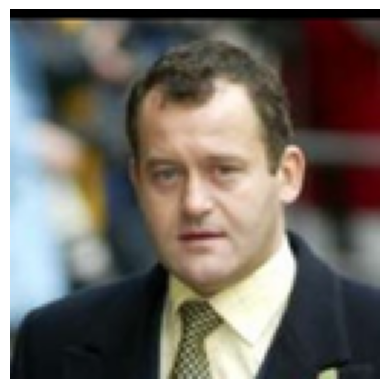

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Female


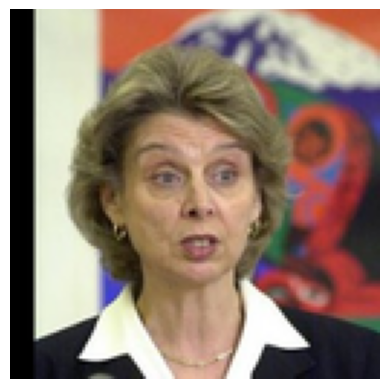

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


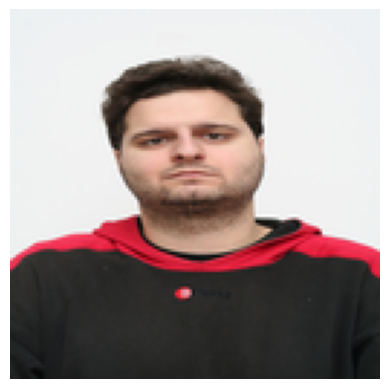

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


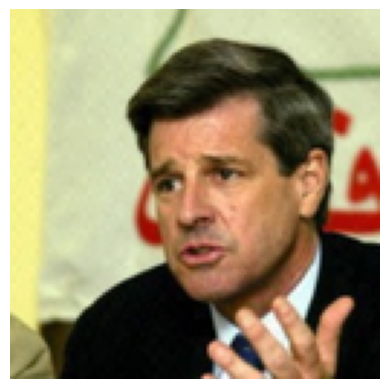

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


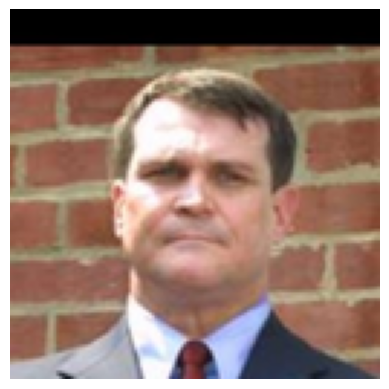

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted Gender: Male


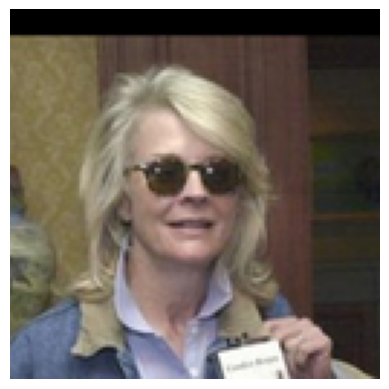

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


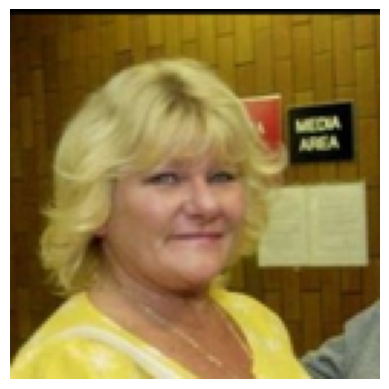

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Male


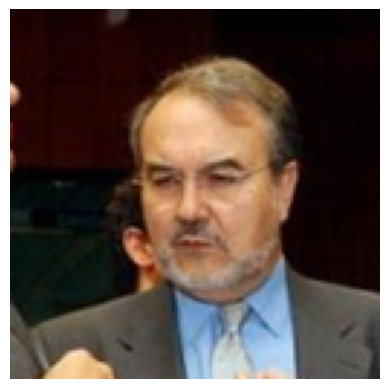

Original Gender: Female
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted Gender: Female


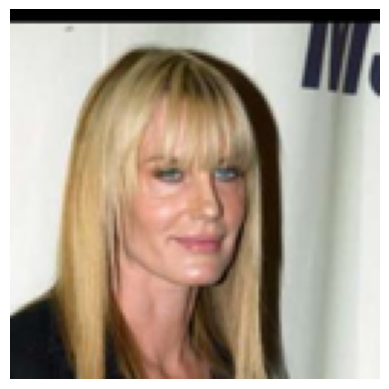

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predicted Gender: Female


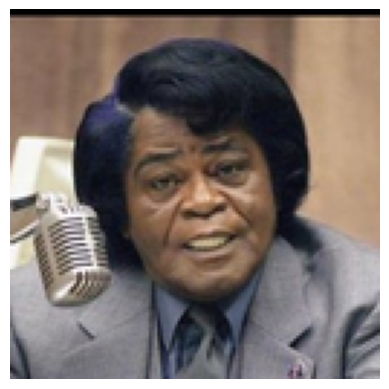

Original Gender: Male
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted Gender: Male


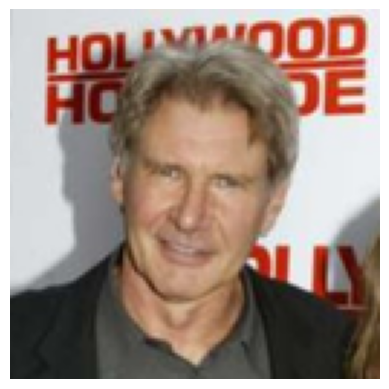

In [42]:
for i in range(100,111):
    print("Original Gender:", gender_dict[y_gender_test[i]])
    # predict from model
    pred = model.predict(X_test[i].reshape(1, 128, 128, 3))
    pred_gender = gender_dict[round(pred[0][0])]
    print("Predicted Gender:", pred_gender)
    plt.axis('off')
    plt.imshow(X_test[i])
    plt.show()